# Training a Foreground Segmentation Tool with DINOv3

In this tutorial, we will train a linear foreground segmentation model using DINOv3 features.

### Setup

Let's start by loading some pre-requisites and checking the DINOv3 repository location:

In [1]:
import io
import os
import pickle
from pathlib import Path

import cv2
import numpy as np
import matplotlib.pyplot as plt
from scipy import signal
from sklearn.metrics import precision_recall_curve, average_precision_score
from sklearn.linear_model import LogisticRegression
import torch
import torchvision.transforms.functional as TF
from tqdm import tqdm
import pyrootutils
from torch import nn

root = pyrootutils.setup_root(
    search_from=Path.cwd().parent,
    indicator=".project-root",
    pythonpath=True,
    dotenv=True,
)

DINOV3_GITHUB_LOCATION = "facebookresearch/dinov3"

if os.getenv("DINOV3_LOCATION") is not None:
    DINOV3_LOCATION = os.getenv("DINOV3_LOCATION")
else:
    DINOV3_LOCATION = DINOV3_GITHUB_LOCATION

print(f"DINOv3 location set to {DINOV3_LOCATION}")

DINOv3 location set to facebookresearch/dinov3


In [2]:
import os
from typing import Any, Optional
import pandas as pd
import numpy as np
from PIL import Image
import torch
from torch.utils.data import DataLoader
from pytorch_lightning import LightningDataModule
from pyflim import data
import albumentations as A

class SchistoDataModule(LightningDataModule):
    def __init__(
        self,
        split: int = 3,
        home: str = "/home/kris/projects/mo445-analise-de-imagem/tarefa_2",
        train_split_ratio: float = 0.5,
        use_flim_data: bool = True,
        batch_size: int = 1,
        num_workers: int = 0,
        seed: int = 2021,
        transforms: Optional[dict[str, list[dict[str, Any]]]] = None,
        use_lab: bool = True,
        image_size: int = 400,
    ):
        super().__init__()
        self.save_hyperparameters()
        
        self.orig_folder = f"{home}/datasets/schisto/images/"
        self.label_folder = f"{home}/datasets/schisto/truelabels/"
        self.marker_folder = f"{home}/data/schisto/split{split}/markers/"
        self.train_split_file = f"{home}/data/schisto/split{split}/train{split}.csv"
        self.test_split_file = f"{home}/data/schisto/split{split}/test{split}.csv"
        
        # --- transforms ---
        self.transforms_cfg = transforms or {}
        self.transforms_train: Optional[A.Compose] = None
        self.transforms_val: Optional[A.Compose] = None
        self.transforms_test: Optional[A.Compose] = None
        
        self.rng = np.random.default_rng(seed)
        
        if transforms:
            self._build_transforms()
    
    # =========================================================================
    # TRANSFORMS LOGIC
    # =========================================================================
    def _build_transforms(self):
        """Build albumentations transforms for train/val/test splits."""
        def build_transform_list(transforms: list[dict]):
            out = []
            for transform in transforms:
                cls_name = transform["class_path"]
                init_args = transform.get("init_args", {})
                if hasattr(A, cls_name):
                    transform_cls = getattr(A, cls_name)
                    out.append(transform_cls(**init_args))
                else:
                    raise ValueError(f"Albumentations has no transform '{cls_name}'")
            return A.Compose(out)

        if "train" in self.transforms_cfg:
            self.transforms_train = build_transform_list(self.transforms_cfg["train"])
        if "val" in self.transforms_cfg:
            self.transforms_val = build_transform_list(self.transforms_cfg["val"])
        if "test" in self.transforms_cfg:
            self.transforms_test = build_transform_list(self.transforms_cfg["test"])

    def setup(self, stage: Optional[str] = None):
        # Get image lists for FLIM training (images with markers)
        images_list_flim = [
            i.replace("-seeds.txt", "") 
            for i in os.listdir(self.marker_folder)
        ]
        
        # Get image lists for GWE training
        train_df = pd.read_csv(self.train_split_file, header=None)
        images_list_gwe_all = [
            i.replace('images/', '').replace('.png', '') 
            for i in train_df[0]
            if i not in images_list_flim and 
            np.array(Image.open(
                self.label_folder + i.replace('images/', '')
            )).max() > 0
        ]
        
        # Split GWE images into train/val
        split_idx = int(self.hparams.train_split_ratio * len(images_list_gwe_all))
        
        # if train_split_ratio is 1, then use all images for training
        if split_idx == len(images_list_gwe_all):
            images_list_gwe_train = images_list_gwe_all
            images_list_gwe_val = images_list_gwe_all
        else:
            images_list_gwe_train = images_list_gwe_all[:split_idx]
            images_list_gwe_val = images_list_gwe_all[split_idx:]
        
        # Test images
        test_df = pd.read_csv(self.test_split_file, header=None)
        images_list_test = [
            i.replace('images/', '').replace('.png', '') 
            for i in test_df[0]
        ]
        
        # print a table summary
        print("Dataset summary:")
        print(f"  FLIM train images: {len(images_list_flim)}")
        print(f"  GWE train images: {len(images_list_gwe_train)}")
        print(f"  GWE val images: {len(images_list_gwe_val)}")
        print(f"  Test images: {len(images_list_test)}")
        
        if stage == "fit" or stage is None:
            self.train_dataset_flim = data.FLIMData(
                orig_folder=self.orig_folder,
                marker_folder=self.marker_folder,
                images_list=images_list_flim,
                label_folder=self.label_folder,
                orig_ext=".png",
                marker_ext="-seeds.txt",
                label_ext=".png",
                transform=self.transforms_train,
                lab_norm=False,
                lab=self.hparams.use_lab
            )
            
            self.train_dataset_gwe = data.FLIMData(
                orig_folder=self.orig_folder,
                images_list=images_list_gwe_train,
                label_folder=self.label_folder,
                orig_ext=".png",
                label_ext=".png",
                transform=self.transforms_train,
                lab_norm=False,
                lab=self.hparams.use_lab
            )
            
            self.val_dataset = data.FLIMData(
                orig_folder=self.orig_folder,
                images_list=images_list_gwe_val,
                label_folder=self.label_folder,
                orig_ext=".png",
                label_ext=".png",
                transform=self.transforms_val,
                lab_norm=False,
                lab=self.hparams.use_lab
            )
        
        if stage == "test" or stage is None:
            self.test_dataset = data.FLIMData(
                orig_folder=self.orig_folder,
                images_list=images_list_test,
                label_folder=self.label_folder,
                orig_ext=".png",
                label_ext=".png",
                transform=self.transforms_test,
                lab_norm=False,
                lab=self.hparams.use_lab
            )
    
    def train_dataloader(self):
        return DataLoader(
            self.train_dataset_flim if self.hparams.use_flim_data else self.train_dataset_gwe,
            batch_size=self.hparams.batch_size,
            shuffle=True,
            num_workers=self.hparams.num_workers
        )
    
    def val_dataloader(self):
        return DataLoader(
            self.val_dataset,
            batch_size=self.hparams.batch_size,
            shuffle=False,
            num_workers=self.hparams.num_workers
        )
    
    def test_dataloader(self):
        return DataLoader(
            self.test_dataset,
            batch_size=self.hparams.batch_size,
            shuffle=False,
            num_workers=self.hparams.num_workers
        )
    
    def predict_dataloader(self):
        return DataLoader(
            self.test_dataset,
            batch_size=self.hparams.batch_size,
            shuffle=False,
            num_workers=self.hparams.num_workers
        )

### Model

Let's load the DINOv3 model. For this notebook, we will be using the ViT-L model.

In [3]:
MODEL_DINOV3_VITS = "dinov3_vits16"
MODEL_DINOV3_VITSP = "dinov3_vits16plus"
MODEL_DINOV3_VITB = "dinov3_vitb16"
MODEL_DINOV3_VITL = "dinov3_vitl16"
MODEL_DINOV3_VITHP = "dinov3_vith16plus"
MODEL_DINOV3_VIT7B = "dinov3_vit7b16"

# MODEL_NAME = MODEL_DINOV3_VITL
# MODEL_NAME = MODEL_DINOV3_VITB
MODEL_NAME = MODEL_DINOV3_VITS
FEAT_LAYER = -1

USE_GRAPH_ESTIMATOR = False

WEIGHTS_MAP = {
    MODEL_DINOV3_VITS: "../checkpoints/dinov3/dinov3_vits16_pretrain_lvd1689m-08c60483.pth",
    MODEL_DINOV3_VITL: "../checkpoints/dinov3/dinov3_vitl16_pretrain_lvd1689m-8aa4cbdd.pth",
    MODEL_DINOV3_VITB: "../checkpoints/dinov3/dinov3_vitb16_pretrain_lvd1689m-73cec8be.pth"
}

model = torch.hub.load(
    repo_or_dir=DINOV3_LOCATION,
    model=MODEL_NAME,
    source="local" if DINOV3_LOCATION != DINOV3_GITHUB_LOCATION else "github",
    weights=WEIGHTS_MAP[MODEL_NAME],
)
model.cuda()

# Assume you have already loaded the model
if USE_GRAPH_ESTIMATOR:
    old_proj = model.patch_embed.proj

    # Create a new Conv2d layer for 8 channels
    new_proj = nn.Conv2d(
        in_channels=8,
        out_channels=old_proj.out_channels,
        kernel_size=old_proj.kernel_size,
        stride=old_proj.stride,
        padding=old_proj.padding,
        bias=old_proj.bias is not None,
    )

    with torch.no_grad():
        # Copy weights according to your mapping
        # Mapping: [R, G, B, R, G, B, R, G]
        new_proj.weight[:, 0, :, :] = old_proj.weight[:, 0, :, :]  # R
        new_proj.weight[:, 1, :, :] = old_proj.weight[:, 1, :, :]  # G
        new_proj.weight[:, 2, :, :] = old_proj.weight[:, 2, :, :]  # B
        new_proj.weight[:, 3, :, :] = old_proj.weight[:, 0, :, :]  # R
        new_proj.weight[:, 4, :, :] = old_proj.weight[:, 1, :, :]  # G
        new_proj.weight[:, 5, :, :] = old_proj.weight[:, 2, :, :]  # B
        new_proj.weight[:, 6, :, :] = old_proj.weight[:, 0, :, :]  # R
        new_proj.weight[:, 7, :, :] = old_proj.weight[:, 1, :, :]  # G

        # Copy bias if it exists
        if old_proj.bias is not None:
            new_proj.bias.copy_(old_proj.bias)

    # Replace the old projection with the new one
    model.patch_embed.proj = new_proj
model.cuda()

Using cache found in /home/kris/.cache/torch/hub/facebookresearch_dinov3_main


DinoVisionTransformer(
  (patch_embed): PatchEmbed(
    (proj): Conv2d(3, 384, kernel_size=(16, 16), stride=(16, 16))
    (norm): Identity()
  )
  (rope_embed): RopePositionEmbedding()
  (blocks): ModuleList(
    (0-11): 12 x SelfAttentionBlock(
      (norm1): LayerNorm((384,), eps=1e-05, elementwise_affine=True)
      (attn): SelfAttention(
        (qkv): LinearKMaskedBias(in_features=384, out_features=1152, bias=True)
        (attn_drop): Dropout(p=0.0, inplace=False)
        (proj): Linear(in_features=384, out_features=384, bias=True)
        (proj_drop): Dropout(p=0.0, inplace=False)
      )
      (ls1): LayerScale()
      (norm2): LayerNorm((384,), eps=1e-05, elementwise_affine=True)
      (mlp): Mlp(
        (fc1): Linear(in_features=384, out_features=1536, bias=True)
        (act): GELU(approximate='none')
        (fc2): Linear(in_features=1536, out_features=384, bias=True)
        (drop): Dropout(p=0.0, inplace=False)
      )
      (ls2): LayerScale()
    )
  )
  (norm): LayerN

### Data
Now that we have the model set up, let's load the training data using the datamodule.

In [4]:
IMAGE_SIZE = 400
PATCH_SIZE = 16

# Initialize datamodule
datamodule = SchistoDataModule(
    batch_size=1,
    use_flim_data=False,
    num_workers=8,
    image_size=IMAGE_SIZE,
    train_split_ratio=1,
)
datamodule.prepare_data()
datamodule.setup()
train_dataloader = datamodule.train_dataloader()

print(f"Number of training batches: {len(train_dataloader)}")

Dataset summary:
  FLIM train images: 4
  GWE train images: 326
  GWE val images: 326
  Test images: 610
Number of training batches: 326


### Building Per-Patch Label Map

Since our models run with a patch size of 16, we have to quantize the ground truth to a 16x16 pixels grid.

In [5]:
# Quantization filter for the given patch size
patch_quant_filter = torch.nn.Conv2d(
    1, 1, PATCH_SIZE, stride=PATCH_SIZE, bias=False
)
patch_quant_filter.weight.data.fill_(1.0 / (PATCH_SIZE * PATCH_SIZE))

def lab_to_rgb_tensor(lab_image: torch.Tensor) -> torch.Tensor:
    """Convert LAB tensor to RGB tensor.
    
    Args:
        lab_image: Tensor of shape (C, H, W) or (B, C, H, W) in LAB format
    
    Returns:
        RGB tensor in the same shape, normalized to [0, 1]
    """
    # Handle batch dimension
    squeeze_dim = False
    if lab_image.ndim == 3:
        lab_image = lab_image.unsqueeze(0)
        squeeze_dim = True
    
    batch_size = lab_image.shape[0]
    rgb_batch = []
    
    for i in range(batch_size):
        # Convert to numpy (H, W, C)
        lab_np = lab_image[i].permute(1, 2, 0).cpu().numpy()
        # Convert LAB to RGB using OpenCV
        rgb_np = cv2.cvtColor(lab_np, cv2.COLOR_LAB2RGB)
        # Convert back to tensor and normalize to [0, 1]
        rgb_tensor = torch.from_numpy(rgb_np).float()
        rgb_batch.append(rgb_tensor.permute(2, 0, 1))
    
    result = torch.stack(rgb_batch)
    return result.squeeze(0) if squeeze_dim else result

Let's visualize a sample image and mask:

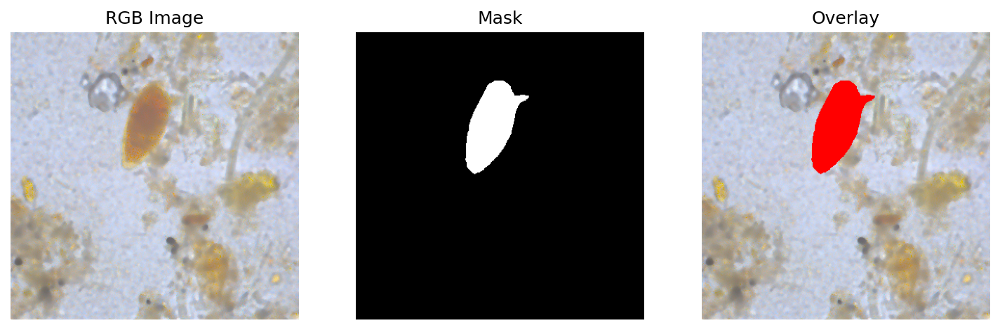

In [6]:
sample_item = next(iter(train_dataloader))
sample_image_lab = sample_item["image"][0]  # (C, H, W)
sample_mask = sample_item["label"][0]  # (H, W) or (1, H, W)

# Convert LAB to RGB
sample_image_rgb = lab_to_rgb_tensor(sample_image_lab)

# Handle mask shape
if sample_mask.ndim == 3:
    sample_mask = sample_mask.squeeze(0)

# Normalize mask to [0, 1] range (already 0-255)
sample_mask_normalized = sample_mask.float() / 255.0

plt.figure(figsize=(12, 4), dpi=150)
plt.subplot(1, 3, 1)
plt.imshow(sample_image_rgb.permute(1, 2, 0))
plt.axis('off')
plt.title("RGB Image")
plt.subplot(1, 3, 2)
plt.imshow(sample_mask_normalized, cmap='gray')
plt.axis('off')
plt.title("Mask")
plt.subplot(1, 3, 3)
# Overlay mask on image
overlay = sample_image_rgb.permute(1, 2, 0).clone()
overlay[sample_mask_normalized > 0.5] = torch.tensor([1.0, 0.0, 0.0])
plt.imshow(overlay)
plt.axis('off')
plt.title("Overlay")
plt.show()

In [7]:
from torch import nn

class GraphWeightEstimator(nn.Module):
    def __init__(self, original_size=(400, 400), embed_dim=8, kernel_size=11, dilation=1):
        super().__init__()
        self.original_size = original_size
        self.kernel_size = kernel_size
        self.dilation = dilation
        self.embed_dim = embed_dim
        
        # Effective kernel size accounting for dilation
        effective_kernel = dilation * (kernel_size - 1) + 1
        
        # Adjust padding to keep the same spatial size
        self.padding = (effective_kernel - 1) // 2

        self.unfold = nn.Unfold(
            kernel_size=self.kernel_size,
            padding=self.padding,
            stride=1,
            dilation=self.dilation
        )
        
        self.fold = nn.Fold(
            output_size=self.original_size,
            kernel_size=1,
            padding=0,
            stride=1
        )

        self.fc = nn.Sequential(
            nn.Linear(3 * kernel_size * kernel_size, 128),
            nn.LeakyReLU(),
            nn.Linear(128, 64),
            nn.LeakyReLU(),
            nn.Linear(64, self.embed_dim)
        )
        
    def forward(self, x):
        # x: (B, 3, H, W)
        x = self.unfold(x)                  # (B, C*k*k, H*W)
        y = self.fc(x.permute(0, 2, 1))     # (B, H*W, embed_dim)
        y = y.permute(0, 2, 1)              # (B, embed_dim, H*W)
        y = self.fold(y)                    # (B, embed_dim, H, W)
        y = y.squeeze(0).permute(1, 2, 0)   # (H, W, embed_dim)
        y = torch.nn.functional.normalize(y, p=2, dim=-1)
        return y

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
graph_weight_estimator = torch.load(f'/home/kris/projects/mo445-analise-de-imagem/tarefa_2/models/estimator_network/best_model_w_flim_triplet_split3.pth', weights_only=False)

def get_representation(image_lab: torch.Tensor) -> torch.Tensor:
    """Get image representation using the graph weight estimator.
    
    Args:
        image_lab: Tensor of shape (C, H, W) in LAB format
    
    Returns:
        Representation tensor of shape (H, W, embed_dim)
    """
    image_representation = graph_weight_estimator(image_lab.unsqueeze(0).cuda()).permute(2, 0, 1)
    
    # normalize to [0, 1]
    image_representation = (image_representation - image_representation.min()) / (image_representation.max() - image_representation.min())
    return image_representation

### Extracting Features and Labels for All the Images

In [8]:
xs = []
ys = []
image_index = []

IMAGENET_MEAN = (0.485, 0.456, 0.406)
IMAGENET_STD = (0.229, 0.224, 0.225)

MODEL_TO_NUM_LAYERS = {
    MODEL_DINOV3_VITS: 12,
    MODEL_DINOV3_VITSP: 12,
    MODEL_DINOV3_VITB: 12,
    MODEL_DINOV3_VITL: 24,
    MODEL_DINOV3_VITHP: 32,
    MODEL_DINOV3_VIT7B: 40,
}

n_layers = MODEL_TO_NUM_LAYERS[MODEL_NAME]

images_with_masks = 0
with torch.inference_mode():
    with torch.autocast(device_type='cuda', dtype=torch.float32):
        for batch_idx, batch in enumerate(tqdm(train_dataloader, desc="Processing images")):
            # Get image and mask
            image_lab = batch["image"][0]  # (C, H, W)
            mask = batch["label"][0]  # (H, W) or (1, H, W)
            mask = TF.resize(mask.unsqueeze(0), [IMAGE_SIZE, IMAGE_SIZE])
            mask = mask.squeeze(0)
            
            # Handle mask shape
            if mask.ndim == 3:
                mask = mask.squeeze(0)
            
            if mask.sum() > 0:
                images_with_masks += 1
            
            # Normalize mask to [0, 1] (already 0-255)
            mask_normalized = mask.float() / 255.0
            
            # Quantize mask to patch grid
            mask_resized = mask_normalized.unsqueeze(0).unsqueeze(0)  # (1, 1, H, W)
            mask_quantized = patch_quant_filter(mask_resized).squeeze().view(-1)
            ys.append(mask_quantized.detach().cpu())
            
            # Convert LAB to RGB
            if USE_GRAPH_ESTIMATOR:
                image_representation = get_representation(image_lab)  # (C, H, W)
                image_representation = TF.resize(image_representation, [IMAGE_SIZE, IMAGE_SIZE])
                image_batch = image_representation.unsqueeze(0).cuda()
            else:
                image_rgb = lab_to_rgb_tensor(image_lab)  # (C, H, W)
                image_normalized = TF.normalize(image_rgb, mean=IMAGENET_MEAN, std=IMAGENET_STD)
                image_normalized = TF.resize(image_normalized, [IMAGE_SIZE, IMAGE_SIZE])
                image_batch = image_normalized.unsqueeze(0).cuda()
            
            # Extract features
            feats = model.get_intermediate_layers(
                image_batch, n=range(n_layers), reshape=True, norm=True
            )
            dim = feats[FEAT_LAYER].shape[1]
            xs.append(feats[FEAT_LAYER].squeeze().view(dim, -1).permute(1, 0).detach().cpu())
            
            image_index.append(batch_idx * torch.ones(ys[-1].shape))

# Concatenate all lists into torch tensors 
xs = torch.cat(xs)
ys = torch.cat(ys)
image_index = torch.cat(image_index)

# Keep only the patches that have clear positive or negative label
idx = (ys < 0.01) | (ys > 0.99)
xs = xs[idx]
ys = ys[idx]
image_index = image_index[idx]

print("Design matrix size:", xs.shape)
print("Label matrix size:", ys.shape)
print("Number of images with masks:", images_with_masks)
print("Number of training batches: ", len(train_dataloader))

Processing images:   0%|          | 0/326 [00:00<?, ?it/s]

Processing images: 100%|██████████| 326/326 [00:10<00:00, 30.62it/s]


Design matrix size: torch.Size([197698, 384])
Label matrix size: torch.Size([197698])
Number of images with masks: 326
Number of training batches:  326


### Retraining with the optimal regularization

In [9]:
best_c = 1e-3

clf = LogisticRegression(
    random_state=0, C=best_c, max_iter=100000, verbose=2
).fit(xs.numpy(), (ys > 0.5).long().numpy())

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    2.1s finished


### Saving the Model for Future Use

In [10]:
save_root = '.'
model_path = os.path.join(save_root, "fg_classifier.pkl")
with open(model_path, "wb") as f:
    pickle.dump(clf, f)

print(f"Model saved to {model_path}")

Model saved to ./fg_classifier.pkl


## Segmentation Pipeline

In [11]:
def f_beta_score(pred_bin, gt, beta2=0.3):
    """Calculate F-beta score"""

    if pred_bin.max() == 0 and gt.max() == 0:
        return 1.0

    TP = np.sum((pred_bin == 1) & (gt == 1))
    FP = np.sum((pred_bin == 1) & (gt == 0))
    FN = np.sum((pred_bin == 0) & (gt == 1))

    if TP == 0:
        return 0.0

    precision = TP / (TP + FP + 1e-8)
    recall = TP / (TP + FN + 1e-8)

    f_beta = ((1 + beta2) * precision * recall) / (
        beta2 * precision + recall + 1e-8
    )
    return float(f_beta)

def dice_coefficient(pred_bin, gt):
    """Calculate Dice coefficient"""

    if pred_bin.max() == 0 and gt.max() == 0:
        return 1.0

    TP = np.sum((pred_bin == 1) & (gt == 1))
    FP = np.sum((pred_bin == 1) & (gt == 0))
    FN = np.sum((pred_bin == 0) & (gt == 1))

    if TP == 0:
        return 0.0

    dice = (2 * TP) / (2 * TP + FP + FN + 1e-8)
    return float(dice)

def sensitivity(pred_bin, gt):
    """Calculate Sensitivity (Recall)"""

    if pred_bin.max() == 0 and gt.max() == 0:
        return 1.0

    TP = np.sum((pred_bin == 1) & (gt == 1))
    FN = np.sum((pred_bin == 0) & (gt == 1))

    if TP + FN == 0:
        return 0.0

    sensitivity = TP / (TP + FN + 1e-8)
    return float(sensitivity)

def specificity(pred_bin, gt):
    """Calculate Specificity"""

    if pred_bin.max() == 0 and gt.max() == 0:
        return 1.0

    TN = np.sum((pred_bin == 0) & (gt == 0))
    FP = np.sum((pred_bin == 1) & (gt == 0))

    if TN + FP == 0:
        return 0.0

    specificity = TN / (TN + FP + 1e-8)
    return float(specificity)

In [12]:
import os
from pathlib import Path
import matplotlib.pyplot as plt
import random
import cv2
import numpy as np

save_dir = Path("low_sensitivity_cases")
save_dir.mkdir(exist_ok=True)


def save_low_sensitivity_case(
    item_id,
    image_rgb,
    fg_score,
    fg_score_bin,
    pred_mask,
    gt_mask,
    save_dir=Path("low_sensitivity_cases"),
):
    """Save diagnostic images for low-sensitivity cases."""
    save_dir.mkdir(exist_ok=True)
    case_dir = save_dir / item_id
    case_dir.mkdir(parents=True, exist_ok=True)

    # Convert tensors to numpy
    image_rgb_np = (image_rgb.permute(1, 2, 0).detach().cpu().numpy() * 255).astype(
        np.uint8
    )

    # Ensure 3 channels
    if image_rgb_np.shape[2] != 3:
        image_rgb_np = np.mean(image_rgb_np, axis=2, keepdims=True)
        image_rgb_np = np.repeat(image_rgb_np, 3, axis=2)

    # Normalize if needed
    if image_rgb_np.max() > 255 or image_rgb_np.min() < 0:
        image_rgb_np = (
            (image_rgb_np - image_rgb_np.min())
            / (image_rgb_np.max() - image_rgb_np.min())
            * 255
        ).astype(np.uint8)

    # Save input image
    cv2.imwrite(
        str(case_dir / "input_image.png"),
        cv2.cvtColor(image_rgb_np, cv2.COLOR_RGB2BGR),
    )

    # --- Save fg_score as colored PNG (viridis colormap) ---
    fg_score_np = fg_score
    fg_score_norm = np.clip(fg_score_np, 0, 1)  # ensure normalized
    cmap = plt.cm.viridis
    colored_fg = (cmap(fg_score_norm)[..., :3] * 255).astype(np.uint8)
    colored_fg_bgr = cv2.cvtColor(colored_fg, cv2.COLOR_RGB2BGR)
    cv2.imwrite(str(case_dir / "fg_score.png"), colored_fg_bgr)

    # Save others
    cv2.imwrite(
        str(case_dir / "fg_score_bin.png"), (fg_score_bin * 255).astype(np.uint8)
    )
    cv2.imwrite(str(case_dir / "pred_mask.png"), (pred_mask * 255).astype(np.uint8))
    cv2.imwrite(str(case_dir / "gt_mask.png"), (gt_mask * 255).astype(np.uint8))


def plot_saved_case_grid(folder="low_sensitivity_cases", n=3):
    """
    Plot n random cases from the saved low-sensitivity samples folder.

    Each row corresponds to one sample:
        [Input Image | FG Score (viridis) | FG Score Bin | Pred Mask | Ground Truth]

    The image ID (subdirectory name) is displayed as a title at the start of each row.
    """
    folder = Path(folder)
    case_dirs = sorted([p for p in folder.iterdir() if p.is_dir()])
    if not case_dirs:
        print("No saved low-sensitivity cases found.")
        return

    n = min(n, len(case_dirs))
    selected_dirs = random.sample(case_dirs, n)

    fig, axs = plt.subplots(
        nrows=n, ncols=5, figsize=(16, 4 * n), squeeze=False
    )

    for row_idx, case_dir in enumerate(selected_dirs):
        img_rgb = cv2.cvtColor(
            cv2.imread(str(case_dir / "input_image.png")), cv2.COLOR_BGR2RGB
        )
        fg_score_color = cv2.cvtColor(
            cv2.imread(str(case_dir / "fg_score.png")), cv2.COLOR_BGR2RGB
        )
        fg_score_bin = cv2.imread(
            str(case_dir / "fg_score_bin.png"), cv2.IMREAD_GRAYSCALE
        )
        pred_mask = cv2.imread(str(case_dir / "pred_mask.png"), cv2.IMREAD_GRAYSCALE)
        gt_mask = cv2.imread(str(case_dir / "gt_mask.png"), cv2.IMREAD_GRAYSCALE)

        images = [img_rgb, fg_score_color, fg_score_bin, pred_mask, gt_mask]
        titles = [
            "Input Image",
            "FG Score (viridis)",
            "FG Score (Binary)",
            "Predicted Mask",
            "Ground Truth",
        ]

        for col_idx, (img, title) in enumerate(zip(images, titles)):
            ax = axs[row_idx, col_idx]
            if title == "Input Image":
                ax.imshow(img)
            elif title == "FG Score (viridis)":
                ax.imshow(img)
            else:
                ax.imshow(img, cmap="gray")

            if row_idx == 0:
                ax.set_title(title, fontsize=10)
            ax.axis("off")

        axs[row_idx, 0].set_title(
            f"Image ID: {case_dir.name}",
            fontsize=11,
            fontweight="bold",
            loc="left",
            pad=20,
        )

    plt.tight_layout()
    plt.savefig("low_sensitivity_cases_grid.png", dpi=300)
    plt.show()

In [13]:
rng = np.random.default_rng(seed=42)

def random_select(mask, percentage=0.3):
    mask = mask.astype(bool)
    
    indices = np.flatnonzero(mask)
    
    num_select = int(len(indices) * percentage)
    selected = rng.choice(indices, num_select, replace=False)
    
    new_mask = np.zeros_like(mask, dtype=np.uint8)
    new_mask.flat[selected] = 1
    return new_mask

In [14]:
import numpy as np
import torch
import cv2
import torch.nn.functional as F
from tqdm import tqdm
import torchvision.transforms.functional as TF
from scipy import ndimage as ndi
import random
import pyift.pyift as ift
import shutil
from skimage.morphology import disk, binary_erosion, binary_dilation
import time

start_time = time.time()

threshold = 0.4
dice_scores = []
sensitivity_scores = []
specificity_scores = []
f_beta_scores = []

# item = next(iterator)
# for _ in range(17):
#     item = next(iterator)
test_dataloader = datamodule.test_dataloader()
# test_dataloader = datamodule.val_dataloader()
iterator = iter(test_dataloader)
# allowed_ids = [1140, 676, 702, 1199, 333, 298, 19, 1123, 580, 1112, 382, 896, 12, 1040, 972, 780, 842, 610]

if os.path.exists("low_sensitivity_cases"):
    shutil.rmtree("low_sensitivity_cases")

for item in tqdm(iterator, total=len(test_dataloader), desc="Evaluating for seed generation"):
    image = item["image"][0]
    mask = item["label"][0]
    item_id = Path(item['image_path'][0]).stem
    
    # if int(item_id) not in allowed_ids:
    #     continue

    test_mask = mask.unsqueeze(0)
    
    test_mask = TF.resize(test_mask, [IMAGE_SIZE, IMAGE_SIZE]).squeeze(0).squeeze(0)
    if USE_GRAPH_ESTIMATOR:
        test_image_representation = get_representation(image)  # (C, H, W)
        test_image_rgb = test_image_representation
        test_image_rgb = TF.resize(test_image_rgb, [IMAGE_SIZE, IMAGE_SIZE]).squeeze(0)
        test_image_normalized = test_image_rgb
    else:
        test_image_rgb = lab_to_rgb_tensor(image)
        test_image_rgb = TF.resize(test_image_rgb, [IMAGE_SIZE, IMAGE_SIZE]).squeeze(0)
        test_image_normalized = TF.normalize(test_image_rgb, mean=IMAGENET_MEAN, std=IMAGENET_STD)

    with torch.inference_mode():
        with torch.autocast(device_type="cuda", dtype=torch.float32):
            feats = model.get_intermediate_layers(
                test_image_normalized.unsqueeze(0).cuda(), n=range(n_layers),
                reshape=True, norm=True
            )
            x = feats[FEAT_LAYER].squeeze().detach().cpu()

    dim = x.shape[0]
    x = x.view(dim, -1).permute(1, 0)
    h_patches = test_image_rgb.shape[1] // PATCH_SIZE
    w_patches = test_image_rgb.shape[2] // PATCH_SIZE

    fg_score = clf.predict_proba(x)[:, 1].reshape(h_patches, w_patches)
    # smooth fg_score
    
    fg_score = cv2.resize(fg_score, (IMAGE_SIZE, IMAGE_SIZE), interpolation=cv2.INTER_LINEAR)
    
    # apply median filter
    # fg_score = cv2.medianBlur((fg_score * 255).astype(np.uint8), 13).astype(np.float32) / 255.0
    
    fg_score_bin = (fg_score >= threshold).astype(np.uint8)

    # Connected components
    num_labels, labels_im = cv2.connectedComponents(fg_score_bin)
    best_label = 0
    max_fg_score_sum = 0

    for label in range(1, num_labels):
        component_mask = (labels_im == label)
        if (component_mask[0, :].any() and component_mask[-1, :].any() and
                component_mask[:, 0].any() and component_mask[:, -1].any()):
            continue
        if component_mask.sum() < 400:
            continue
        fg_score_sum = fg_score[component_mask].sum()
        if fg_score_sum > max_fg_score_sum:
            max_fg_score_sum = fg_score_sum
            best_label = label

    gt_mask = (test_mask.numpy() > 0).astype(np.uint8)
    
    if best_label == 0:
        pred_mask = np.zeros_like(fg_score_bin, dtype=np.uint8)
        dice_score = dice_coefficient(pred_mask, gt_mask)
        dice_scores.append(dice_score)
        sens_score = sensitivity(pred_mask, gt_mask)
        sensitivity_scores.append(sens_score)
        spec_score = specificity(pred_mask, gt_mask)
        specificity_scores.append(spec_score)
        f_beta = f_beta_score(pred_mask, gt_mask, beta2=0.3)
        f_beta_scores.append(f_beta)
        
        if sens_score * 100 < 55:
            save_low_sensitivity_case(
                item_id=item_id,
                image_rgb=test_image_rgb,
                fg_score=fg_score,
                fg_score_bin=fg_score_bin,
                pred_mask=pred_mask,
                gt_mask=gt_mask,
            )
        
        continue
    
    pred_mask = (labels_im == best_label).astype(np.uint8)
    
    # 1. Dilate main object generously
    dilate_radius = 80  # tune this; for 256x256 images, 30–60 works well
    kernel = cv2.getStructuringElement(cv2.MORPH_ELLIPSE, (dilate_radius, dilate_radius))
    dilated_mask = cv2.dilate(pred_mask, kernel)

    # 2. Apply a relaxed threshold to FG scores
    low_thresh = 0.25
    fg_low = (fg_score >= low_thresh).astype(np.uint8)

    # 3. Keep only parts of the low-threshold map that lie within the dilated region
    expanded_mask = cv2.bitwise_and(fg_low, dilated_mask)

    # Optional: keep the connected component overlapping the original object the most
    num_labels, labels = cv2.connectedComponents(expanded_mask)
    best_overlap_label = 0
    max_overlap = 0
    for lbl in range(1, num_labels):
        comp = (labels == lbl)
        overlap = np.sum(comp & pred_mask)
        if overlap > max_overlap:
            max_overlap = overlap
            best_overlap_label = lbl
    pred_mask = (labels == best_overlap_label).astype(np.uint8)
    
    # pred_mask = cv2.medianBlur(pred_mask, 5)
    # pred_mask = cv2.dilate(pred_mask, np.ones((10, 10), np.uint8))
    # pred_mask = cv2.morphologyEx(pred_mask, cv2.MORPH_CLOSE, np.ones((7, 7), np.uint8))

    dice_score = dice_coefficient(pred_mask, gt_mask)
    dice_scores.append(dice_score)
    sens_score = sensitivity(pred_mask, gt_mask)
    sensitivity_scores.append(sens_score)
    spec_score = specificity(pred_mask, gt_mask)
    specificity_scores.append(spec_score)
    f_beta = f_beta_score(pred_mask, gt_mask, beta2=0.3)
    f_beta_scores.append(f_beta)
    
    if sens_score * 100 < 55:
        save_low_sensitivity_case(
            item_id=item_id,
            image_rgb=test_image_rgb,
            fg_score=fg_score,
            fg_score_bin=fg_score_bin,
            pred_mask=pred_mask,
            gt_mask=gt_mask,
        )

end_time = time.time()
print(f"Evaluation completed in {end_time - start_time:.2f} seconds.")

print(f"Average Dice Score: {np.nanmean(dice_scores):.4f} ± {np.nanstd(dice_scores):.4f}")
print(f"Average Sensitivity: {np.nanmean(sensitivity_scores):.4f} ± {np.nanstd(sensitivity_scores):.4f}")
print(f"Average Specificity: {np.nanmean(specificity_scores):.4f} ± {np.nanstd(specificity_scores):.4f}")
print(f"Average F-beta Score: {np.nanmean(f_beta_scores):.4f} ± {np.nanstd(f_beta_scores):.4f}")

Evaluating for seed generation: 100%|██████████| 610/610 [01:03<00:00,  9.55it/s]

Evaluation completed in 64.07 seconds.
Average Dice Score: 0.8814 ± 0.2323
Average Sensitivity: 0.8709 ± 0.2424
Average Specificity: 0.9982 ± 0.0049
Average F-beta Score: 0.8904 ± 0.2305


In [15]:
# get number of saved cases
num_saved_cases = len(list(Path("low_sensitivity_cases").iterdir()))
print(f"Number of low-sensitivity cases saved: {num_saved_cases}")

Number of low-sensitivity cases saved: 48


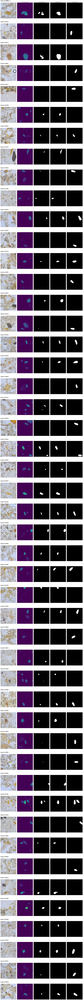

In [16]:
plot_saved_case_grid("low_sensitivity_cases", n=num_saved_cases)